# Intersection Comparison

In [140]:
import matplotlib.pyplot as plt

# font
plt.rcParams['font.sans-serif'] = ['Arial']
LABEL_FONT = {
    "fontsize": 12,
    "weight": "bold",
}    

# colors
BLUE = '#2878B5'
LIGHTBLUE = '#9AC9DB'
ORANGE = '#F8AC8C'
RED = '#C82423'
PINK = '#FF8884'
GREY = '#9E9E9E'
DEEPGREEN = '#32B897'
GREEN = '#96CCCB'

plt.rcParams['figure.dpi'] = 500

## 1 Data

In [35]:
from analysis import Aggregator

# bins
agg = Aggregator()
SPEED_BIN = agg.SPEED_BIN
ACC_BIN = agg.ACC_BIN
DECEL_BIN = agg.BRAKE_DECEL_BIN
VSP_BIN = agg.VSP_BIN

import pandas as pd
import numpy as np
OpModeERs = np.load("./data/agg/OpModeERs.npy")

In [3]:
import pickle
with open("./data/agg/agg_node.pkl", 'rb') as f:
    agg_node = pickle.load(f)

# parameter calculation
def calParams(aggFile):
    aggFile['brakeFrac'] = aggFile['brakeCount'] / aggFile['trajCount']
    aggFile['brakeFreq'] = aggFile['brakeEventNum'] / aggFile['mileage']  # #/km
    aggFile['brakeTimeMean'] = aggFile['brakeCount'] / aggFile['brakeEventNum']  # sec
    aggFile['OpModeFrac'] = aggFile['OpModeCount'] / aggFile['trajCount']
    aggFile['brakeDecelMean'] = aggFile['brakeDecelMean'].apply(np.abs)
    aggFile['PM10 ER Avg'] = aggFile['OpModeFrac'].apply(lambda x: sum(x * OpModeERs))
    aggFile['Daily BWE'] = aggFile['PM10 ER Avg'] * aggFile['trajCount'] / 3600 / 30
    aggFile['PM10 EF Avg'] = aggFile['Daily BWE'] * 30 / aggFile['mileage'] * 1000  # mg/km/veh
    aggFile.replace(np.inf, 0, inplace=True)
    return aggFile

# calculate parameters
agg_node['brakeEventNum'] = agg_node['brakeEventNum'].astype('float32')
agg_node['brakeCount'] = agg_node['brakeCount'].astype('int32')
agg_node = calParams(agg_node)
agg_node.fillna(value=0, inplace=True)

int_col = ['trajCount', 'brakeCount', 'brakeEventNum']
float_col = ['mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'brakeFrac', 'brakeFreq', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg']
agg_node[int_col] = agg_node[int_col].astype('int32')
agg_node[float_col] = agg_node[float_col].astype('float32')

import geopandas as gpd
nodes = gpd.read_file("./data/geo/nodes/nodes.shp")

# link-level aggregation
agg_node = agg_node.join(nodes.set_index('osmid'))  # add geo info
agg_node = gpd.GeoDataFrame(agg_node, geometry='geometry')  # transfer to gdf
agg_node.fillna(value='unsignalized', inplace=True)
agg_node = agg_node[agg_node['street_cou'] > 1]  # consider >2 links only

agg_node['length'] = agg_node['street_cou'] * 20  # length
agg_node['trajVol'] = agg_node['trajCount'] / agg_node['length'] * 1000 / 30 / 24 # #/km/h

## 2 Plot

### Size

In [203]:
# generate sizes
bins = [0, 20, 40, agg_node['PM10 EF Avg'].max()]
labels = ['0-20', '20-40', '> 40']
agg_node['size_category'] = pd.cut(agg_node['PM10 EF Avg'], bins=bins, labels=labels, right=False)

size_mapping = {
    '0-20': 5,
    '20-40': 25,
    '> 40': 50
}
agg_node['sizes'] = agg_node['size_category'].map(size_mapping)

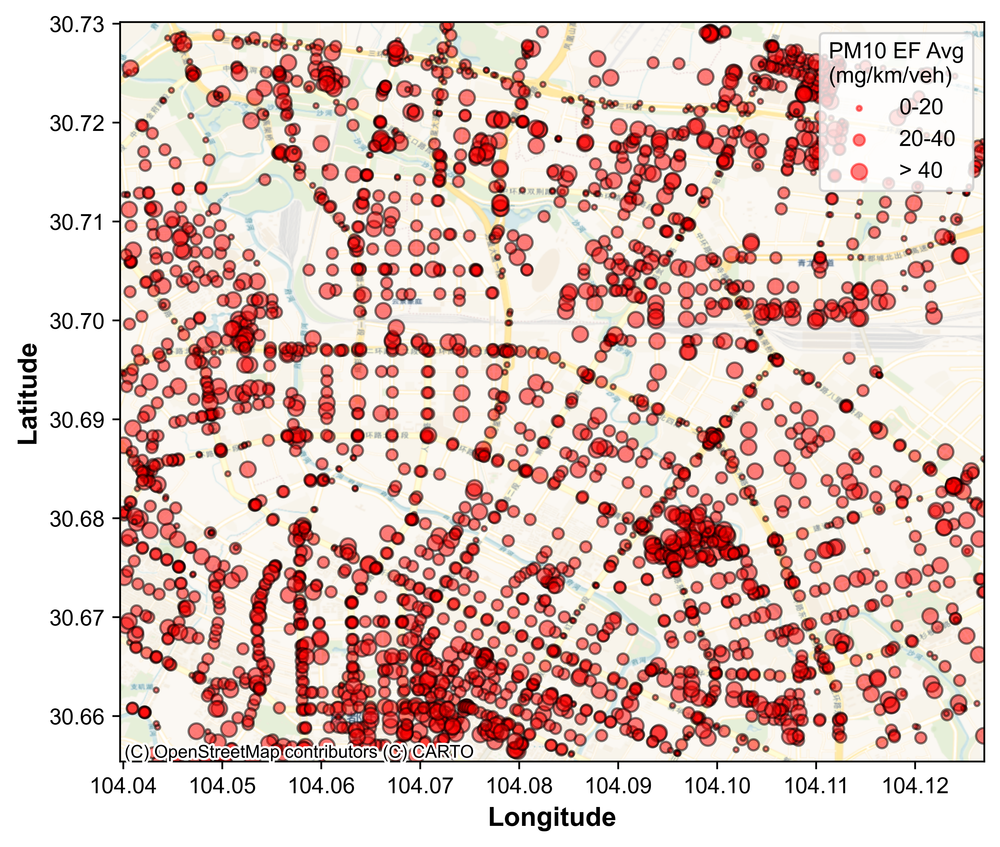

In [204]:
import contextily as ctx

fig, ax = plt.subplots(1, 1, figsize=(8,6))

# plot elevation
agg_node.plot(ax=ax, color='red', edgecolor='black', markersize=agg_node['sizes'], alpha=0.5)

# axis
east, west, north, south = 104.1269937640354, 104.03967976411019, 30.73017827690331, 30.655405046818046
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.xlabel('Longitude', fontdict=LABEL_FONT)
plt.ylabel('Latitude', fontdict=LABEL_FONT)

# legend
legend_handles = [plt.scatter([], [], s=size, color='red', alpha=0.5) for size in size_mapping.values()]
ax.legend(legend_handles, size_mapping.keys(), title="PM10 EF Avg\n(mg/km/veh)", scatterpoints=1, loc='upper right')

# basemap
ctx.add_basemap(ax=ax, crs=agg_node.crs.to_string(), source=ctx.providers.CartoDB.Voyager)
plt.show()

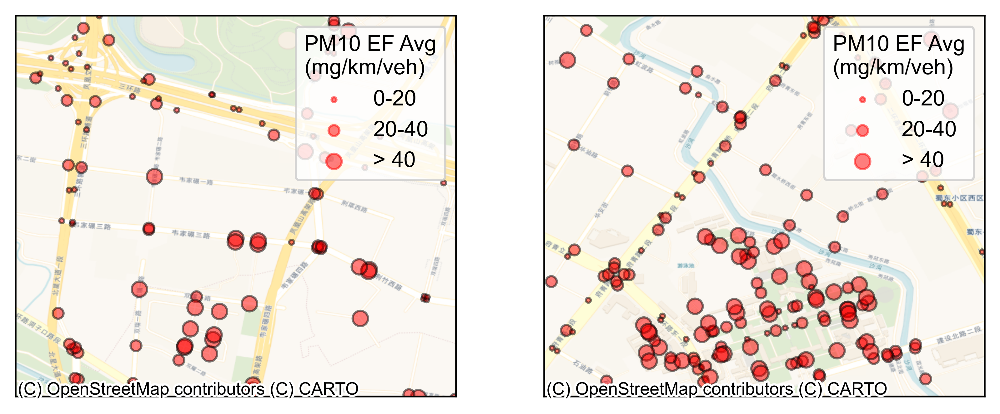

In [205]:
import contextily as ctx

fig, ax = plt.subplots(1,2, figsize=(8,4))

# fig1
agg_node.plot(ax=ax[0], color='red', edgecolor='black', markersize=agg_node['sizes'], alpha=0.5)
ax[0].set_xlim(104.07, 104.085)
ax[0].set_ylim(30.715, 30.728)
ax[0].set_xticks([])
ax[0].set_yticks([])
legend_handles = [plt.scatter([], [], s=size, color='red', alpha=0.5) for size in size_mapping.values()]
ax[0].legend(legend_handles, size_mapping.keys(), title="PM10 EF Avg\n(mg/km/veh)", scatterpoints=1, loc='upper right')
ctx.add_basemap(ax=ax[0], crs=agg_node.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

# fig2
agg_node.plot(ax=ax[1], color='red', edgecolor='black', markersize=agg_node['sizes'], alpha=0.5)
ax[1].set_xlim(104.09, 104.105)
ax[1].set_ylim(30.675, 30.688)
ax[1].set_xticks([])
ax[1].set_yticks([])
legend_handles = [plt.scatter([], [], s=size, color='red', alpha=0.5) for size in size_mapping.values()]
ax[1].legend(legend_handles, size_mapping.keys(), title="PM10 EF Avg\n(mg/km/veh)", scatterpoints=1, loc='upper right')
ctx.add_basemap(ax=ax[1], crs=agg_node.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

plt.show()

### Class

In [206]:
# generate sizes
bins = [0, 20, 40, agg_node['PM10 EF Avg'].max()]
labels = ['0-20', '20-40','> 40']
agg_node['size_category'] = pd.cut(agg_node['PM10 EF Avg'], bins=bins, labels=labels, right=False)

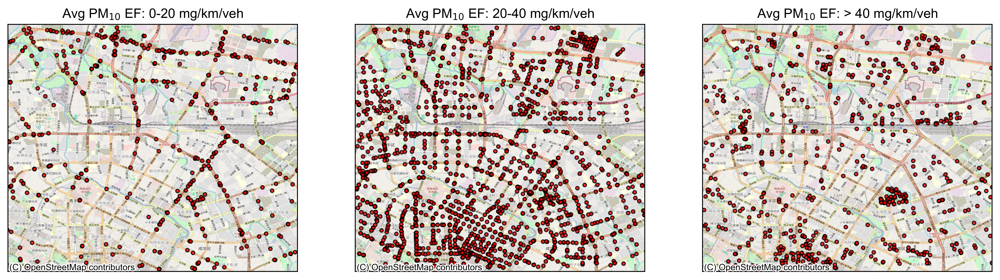

In [208]:
import contextily as ctx

fig, ax = plt.subplots(1,3, figsize=(16,6))
ax = ax.flatten()
# plot
for ax_, label in zip(ax, labels):
    agg = agg_node[agg_node['size_category'] == label]
    agg.plot(ax=ax_, color='red', edgecolor='black', markersize=10, alpha=0.8)

    # text
    ax_.set_title('Avg PM$_{10}$ EF: %s mg/km/veh' % label)

    # axis
    east, west, north, south = 104.1269937640354, 104.03967976411019, 30.73017827690331, 30.655405046818046
    ax_.set_xlim(west, east)
    ax_.set_ylim(south, north)
    ax_.set_xticks([])
    ax_.set_yticks([])

    # basemap
    ctx.add_basemap(ax=ax_, crs=agg_node.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()